# Семинар 3 - Алгоритмы предварительной обработки изображений и их реализация

***

In [1]:
from pathlib import Path

import cv2
import skimage
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

### Свертка (Convolution)

1. Определение

![](https://upload.wikimedia.org/wikipedia/commons/6/6e/Convolution_of_box_signal_with_itself.gif "conv1")

![](https://upload.wikimedia.org/wikipedia/commons/6/67/Convolution_of_spiky_function_with_box.gif "conv2")

$\textbf{Свёртка, конволюция}$ — операция, которая при применении к двум функциям
$f(x)$ и $g(x)$ возвращает третью функцию, соответствующую взаимнокорреляционной функции $f(x)$ и $g(-x)$. Смысл - "схожесть" одного сигнала с отраженным другим. Другими словами, имеется система, подается на вход сигнал, выход системы - результат свертки.

В компьютерном зрении часто рассматривают как системы - различные фильтры (выделения краев, медианный фильтр и другие). Адаптивно подстраивая их, мы сможем получать нужные выходные сигналы.

Свойства:

1. $f*g = g*f$
2. $f*(g*h) = (f*g)*f*h$
3. $(f_{1}+f_{2})*g = f_{1}*g + f_{2}*g$
4. $(\alpha f)*g = f*(\alpha g)$

Одномерный случай свертки

$$ w(t) = \sum\limits_{\tau=0}^{t} g(\tau)^{*} f(t - \tau) $$

где ${*}$ означает комплексное сопряжение.

2. Теория

Идея свертки основывается на дискретном [преобразовании Фурье](https://ru.wikipedia.org/wiki/Преобразование_Фурье) (ДПФ). Можно разложить сигнал на элементарные составляющие - гармонические колебания с разными частотами. В получившийся частотной области исследовать сигнал проще.

Например, если рассматривать линейные системы, то если мы знаем характеристику системы $F$, то можем при любом входном сигнале $G$ получить выходной сигнал $W$ по формуле в частотной области: $W(w) = G(w)F(w)$

ДПФ прямое: $G(w) = \sum\limits_{t=0}^{N-1} g(t) e^{-\frac{2 \pi i}{N} w t}$.

ДПФ обратное: $g(t) = \frac{1}{N} \sum\limits_{w=0}^{N-1} G_(w) e^{\frac{2\pi i}{N} w t}$.

3. Визуализация в частотной области

Используя формулу Эйлера $e^{j\omega T} = cos(\omega T) + j\cdot sin(\omega T)$, можно определить *вещественную* и *мнимую* составляющие, а также **модуль** и **аргумент** спектральной плотности, которые связаны с вещественной и мнимой частями спектра через формулы теории функции комплексного переменного.

Модуль: $|X(kT)| = \sqrt{Re(X)^2 + Im(X)^2}$

Фаза: $arg(X(kT)) = \arctan{\frac{Im(X)}{Re(X)}}$







### Методы фильтрации изображений

Рассмотрим несколько стандартных моделей шума
1. $\textbf{Соль и перец}$ - случайные черные и белые пиксели
2. $\textbf{Импульсный}$ - случайные белые пиксели
3. $\textbf{Гауссов}$ - колебания яркости, распределенные по нормальному закону

Проанализируем часть из них на одномерных массивах

interactive(children=(IntSlider(value=1, description='value', max=30, min=-10), IntSlider(value=127, descripti…

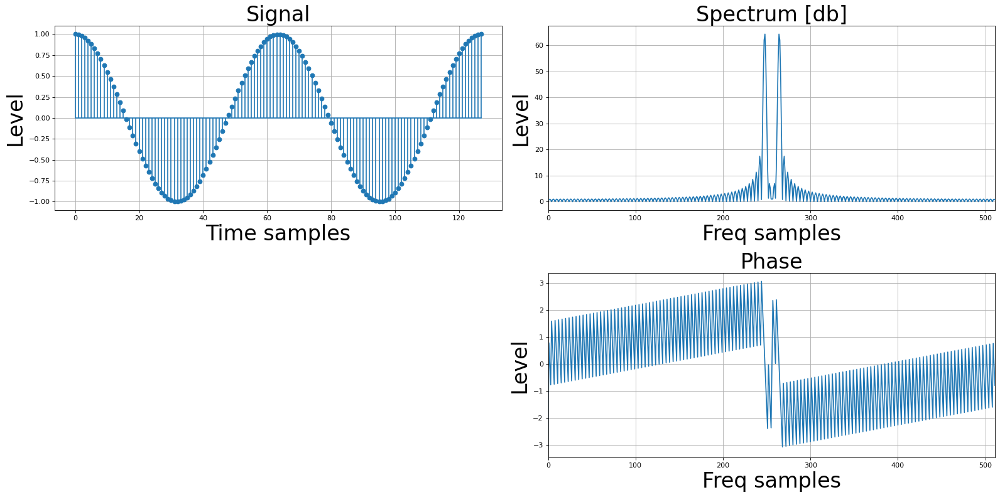

In [2]:
import ipywidgets
from scipy.fftpack import (
    fft, ifft,
    fft2, ifft2,
    fftshift, ifftshift,
)

def viz_signal(
    signal: list,
) -> None:

    # signal
    x = np.array(signal)

    # Forward FFT
    N = 512
    xFFT = fftshift(fft(x, N))
    # Magnitude spectrum
    xA = np.abs(xFFT)
    # Phase spectrum
    xF = np.angle(xFFT)

    # List of signals
    xT = [x, xA, xF, ]
    lst_title = ['Signal', 'Spectrum [db]', 'Phase']

    # Plot results
    fig = plt.figure(figsize=(20, 10), dpi=80)

    for i, sig in enumerate(xT):
        plt.subplot(2, 2, int(2**i))
        plt.ylabel('Level', fontsize=30)
        plt.title(lst_title[i], fontsize=30)
        if i == 0:
            plt.stem(sig, basefmt='C0')
            plt.xlabel('Time samples', fontsize=30)
        else:
            plt.plot(sig)
            plt.xlabel('Freq samples', fontsize=30)
            plt.xlim([0, N - 1])
        plt.grid()

    plt.tight_layout()

#define signal
N = 128
# time vector
t = np.linspace(0, 1, N)
# freq
f1 = 2
signal = np.cos(2*np.pi*f1*t)

@ipywidgets.interact(
    value=ipywidgets.IntSlider(
        min=-10, max=30,
        step=1, value=signal[N - 1],
    ),
    pos=ipywidgets.IntSlider(
        min=0, max=N,
        step=1, value=N - 1,
    ),
)
def play_with_signal(
    value: int,
    pos: int,
) -> None:

    signal[pos] = value

    viz_signal(signal)

# Упражнение 1  (оцениваемое)

**Это и дальнейшие упражнения и вопросы будут оцениваться**

Реализуйте шумы типа соль/перец и гаусов шум. Визуализируйте результаты - добавьте шум к предложенному изображению астронавта.

In [3]:
def saltpepper_noise(
    image: np.array,
    proportion: float=0.2,
) -> np.array:
    # your code

    rng = np.random.rand(image.shape[0], image.shape[1])
    noisy = image.copy()
    noisy[rng < proportion] = 0
    noisy[rng > 1 - proportion] = 1

    return noisy

def gaussian_noise(
    image: np.array,
    mean: float=0.04,
    sigma: float=0.07,
) -> np.array:
    # your code

    gaussian = np.random.normal(mean, sigma, (image.shape))
    noisy = image.copy()
    noisy = noisy + gaussian

    return np.clip(noisy, 0, 255).astype(np.uint8)
def do_nothing(
    image: np.array,
) -> np.array:
    return image

Text(0.5, 1.0, 'With gaussian noise: mean=0, std=100')

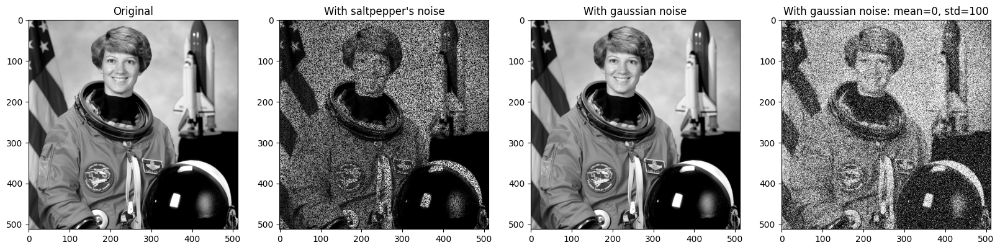

In [4]:
from skimage import data

img = cv2.cvtColor(
    src=data.astronaut(),
    code=cv2.COLOR_RGB2GRAY,
)

# your code

a = saltpepper_noise(image=img)
b = gaussian_noise(image=img)
c = gaussian_noise(image=img, mean=0., sigma=100.)

plt.figure(figsize=(20, 20))
plt.subplot(141)
plt.imshow(img, cmap="gray")
plt.title("Original")
plt.subplot(142)
plt.imshow(a, cmap="gray")
plt.title("With saltpepper's noise")
plt.subplot(143)
plt.imshow(b, cmap="gray")
plt.title("With gaussian noise")
plt.subplot(144)
plt.imshow(c, cmap="gray")
plt.title("With gaussian noise: mean=0, std=100")

# Упражнение 2

Посмотрите также разницу на других фотографиях - они доступны в `skimage.data`

Text(0.5, 1.0, 'With gaussian noise: mean=0, std=100')

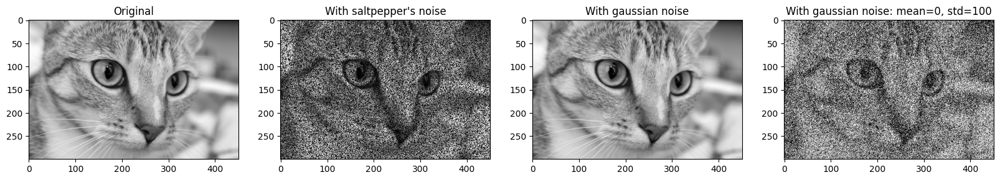

In [5]:
#your code here

img = cv2.cvtColor(
    src=skimage.data.chelsea(),
    code=cv2.COLOR_RGB2GRAY,
)
a = saltpepper_noise(image=img)
b = gaussian_noise(image=img)
c = gaussian_noise(image=img, mean=0., sigma=100.)

plt.figure(figsize=(20, 20))
plt.subplot(141)
plt.imshow(img, cmap="gray")
plt.title("Original")
plt.subplot(142)
plt.imshow(a, cmap="gray")
plt.title("With saltpepper's noise")
plt.subplot(143)
plt.imshow(b, cmap="gray")
plt.title("With gaussian noise")
plt.subplot(144)
plt.imshow(c, cmap="gray")
plt.title("With gaussian noise: mean=0, std=100")

Text(0.5, 1.0, 'With gaussian noise: mean=0, std=100')

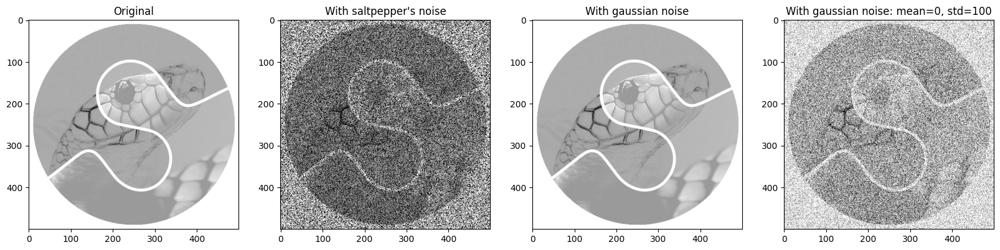

In [6]:
img = cv2.cvtColor(
    src=skimage.data.logo(),
    code=cv2.COLOR_RGB2GRAY,
)
a = saltpepper_noise(img)
b = gaussian_noise(img)
c = gaussian_noise(image=img, mean=0., sigma=100.)

plt.figure(figsize=(20, 20))
plt.subplot(141)
plt.imshow(img, cmap="gray")
plt.title("Original")
plt.subplot(142)
plt.imshow(a, cmap="gray")
plt.title("With saltpepper's noise")
plt.subplot(143)
plt.imshow(b, cmap="gray")
plt.title("With gaussian noise")
plt.subplot(144)
plt.imshow(c, cmap="gray")
plt.title("With gaussian noise: mean=0, std=100")

Text(0.5, 1.0, 'With gaussian noise: mean=0, std=100')

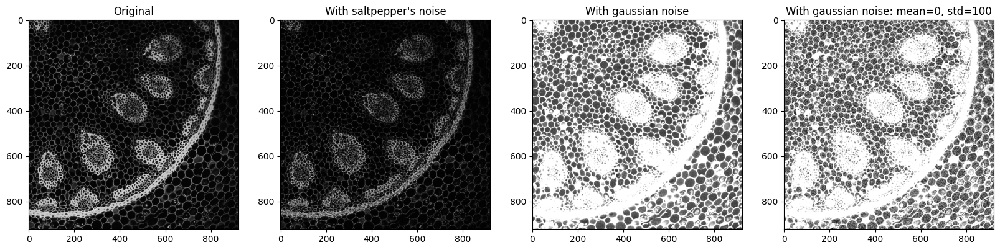

In [7]:
img = cv2.cvtColor(
    src=skimage.data.lily(),
    code=cv2.COLOR_RGB2GRAY,
)
a = saltpepper_noise(img)
b = gaussian_noise(img)
c = gaussian_noise(image=img, mean=0., sigma=100.)

plt.figure(figsize=(20, 20))
plt.subplot(141)
plt.imshow(img, cmap="gray")
plt.title("Original")
plt.subplot(142)
plt.imshow(a, cmap="gray")
plt.title("With saltpepper's noise")
plt.subplot(143)
plt.imshow(b, cmap="gray")
plt.title("With gaussian noise")
plt.subplot(144)
plt.imshow(c, cmap="gray")
plt.title("With gaussian noise: mean=0, std=100")

# Базовые фильтры

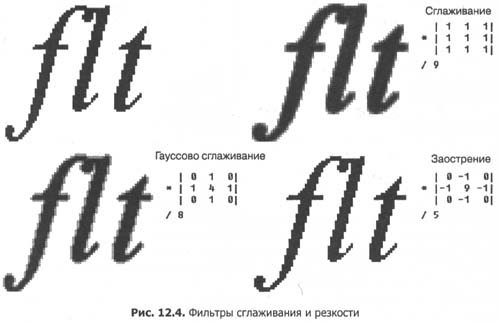

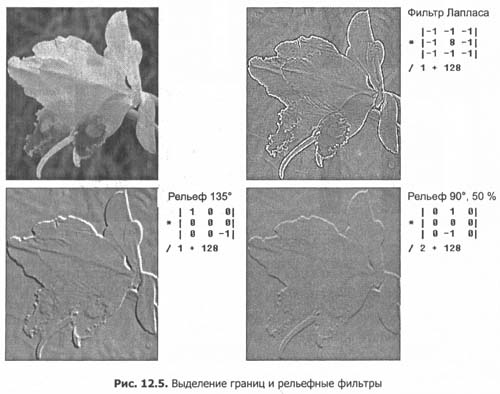

Рассмотрим линейные фильтры, основанные, конечно же, на конволюции.

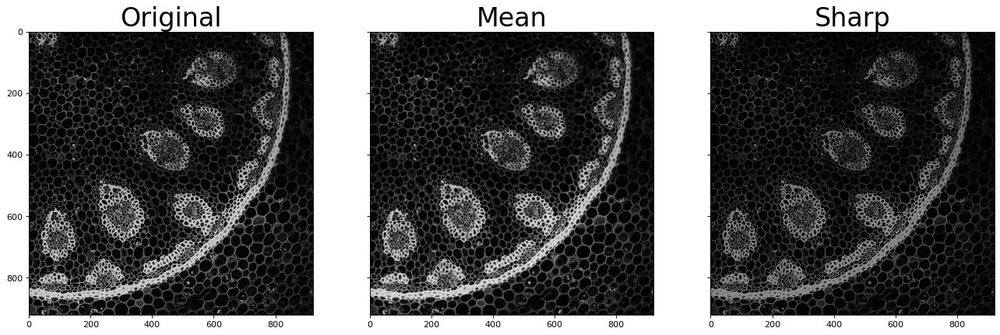

In [8]:
nothing = np.array([
    [1., ],
])

mean = np.array([
    [1, 1, 1, ],
    [1, 1, 1, ],
    [1, 1, 1, ],
]) / 9

sharp = np.array([
    [0, -1, 0, ],
    [-1, 9, -1, ],
    [0, -1, 0, ],
]) / 5

filters = [nothing, mean, sharp, ]
lst_title = ['Original', 'Mean', 'Sharp', ]

fig, axes = plt.subplots(
    ncols=len(lst_title),
    sharex=True,
    sharey=True,
    figsize=(20, 10),
    dpi=80,
)
for i in range(len(filters)):

    filtered_img = cv2.filter2D(
        src=img,
        kernel=filters[i],
        ddepth=-1, #the same depth as input
        borderType=cv2.BORDER_CONSTANT,
        anchor=(-1, -1), #center of the kernel
        delta=0, #additional data added to
    )

    axes[i].imshow(filtered_img, cmap='gray')
    axes[i].set_title(lst_title[i], fontsize=30)

<Figure size 2500x2500 with 0 Axes>

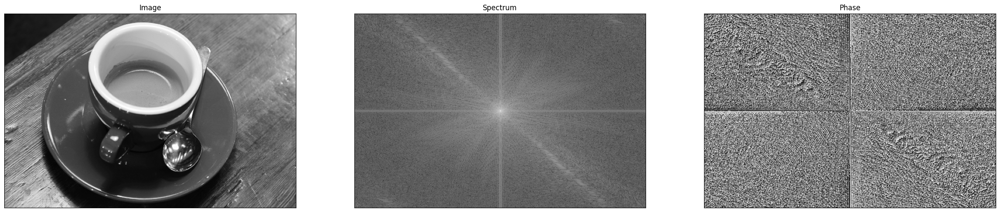

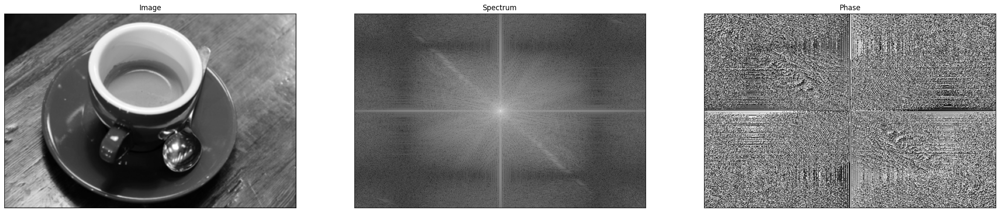

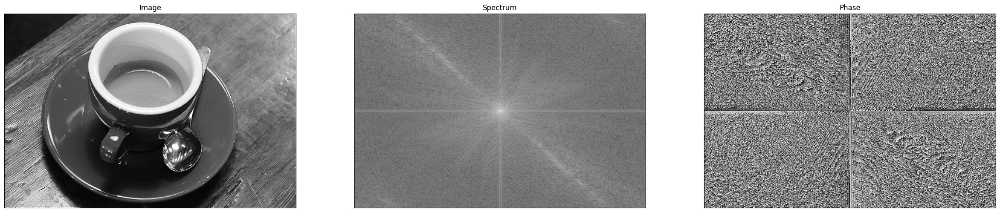

In [9]:
img = cv2.cvtColor(
    src=skimage.data.coffee(),
    code=cv2.COLOR_RGB2GRAY
)

filters = [nothing, mean, sharp]
filt_titles = ['Original', 'Mean', 'Sharp']
plt.figure(figsize=(25, 25))
for i in range(len(filters)):

    x = cv2.filter2D(
        src=img,
        kernel=filters[i],
        ddepth=-1, #the same depth as input
        borderType=cv2.BORDER_CONSTANT,
        anchor=(-1, -1), #center of the kernel
        delta=0, #additional data added to
    )

    xFFT = fftshift(fft2(x))
    # Magnitude spectrum
    xA = 255 / np.log(1 + np.max(np.abs(x))) * np.log(1 + np.abs(xFFT))
    # Phase spectrum
    xF = np.angle(xFFT)

    # List of signals
    xT = [x, xA, xF]
    lst_title = ['Image', 'Spectrum', 'Phase']

    # Plot results
    fig = plt.figure(figsize=(30, 10))
    for j, sig in enumerate(xT):
        plt.subplot(1, 3, j+1)
        plt.title(lst_title[j])
        plt.imshow(sig, cmap='gray')
        plt.xticks([])
        plt.yticks([])

Особенность свертки - ее локальность. Чем больше ядро светки - тем в большей окрестности она охватывает пиксели.

# Вопрос

Проанализируйте спектр и фазы зашумленных сигналов после применения фильтров. Что изменилось?

**Ответ:** Анализируя спектр можно отметить, что на изображении выделяется несколько доминирующих направлений (вертикальное, горизонтальное и диагональное), которые образованы четкими границами чашки и стола, а также тёмных линий и неровностей на самом столе. Эти направления секут в перпендикулярном направлении границы объектов, а также остаются контрастными и после фильтрации. Низкочастотные сигналы, соответствующие наиболее амплитудным (ярким) сигналам на картине спектра (Spectrum), группируются вблизи центра и отождествляются с медленно меняющимися компонентами исходного изображения (цвет стола, чашки и т.д.). Высокочастотные (тёмные) сигналы соответствуют быстро меняющимся компонентам (границы объектов).

Отметим, что в нашем случае, судя по спектру, низкие частоты являются более информативными, чем высокие. Однако средний фильтр стремится подавить низкие частоты, что особенно заметно по краям картины спектра. Это приводит к небольшому эффекту размытия, поскольку значения интенсивности спектра упали. А шарп-фильтр усиливает значения спектра, что особенно заметно по доминирующим направлениям, вследствие чего границы объектов (на изображении), перпендикулярные этим направлениям, становятся более чёткими, чем на оригинальном фото.

Фаза не несёт принципиально новой информации, она скорее подкрепляет выводы, сделанные по картине спектра.

# Упражение 3

Реализуйте свою свертку и сравните с реализацией `cv2.filter2D` (визуализируйте результаты работы своей свертки и библиотечной с одинаковым ядром + посмотрите на разность значений пикселей после обработки).

In [10]:
#your code here

def myconv2d(img, kernel, out_channels=1, bias=0, stride=[1, 1], padding=0):

    h, w = img.shape[-2], img.shape[-1]
    k_h, k_w = kernel.shape[-2], kernel.shape[-1]
    h_out = (h - k_h + 2 * padding) // stride[0] + 1
    w_out = (w - k_w + 2 * padding) // stride[1] + 1
    output = np.zeros((h_out, w_out))

    if padding != 0:
        img = np.insert(arr=img, obj=[0, img.shape[-2]], values=np.zeros(img.shape[-1])[0],
                  axis=0)
        img = np.insert(arr=img, obj=[0, img.shape[-1]], values=np.zeros(img.shape[-2])[0],
                  axis=1)

    for row in range(output.shape[0]):
        for col in range(output.shape[1]):
            output[row, col] = np.sum(np.multiply(img[row*stride[0]:row*stride[0]+k_h,
                                      col*stride[1]:col*stride[1]+k_w], kernel)) + bias

    return np.clip(output, 0, 255).astype(np.uint8)

((300, 451), (300, 451), (300, 451))

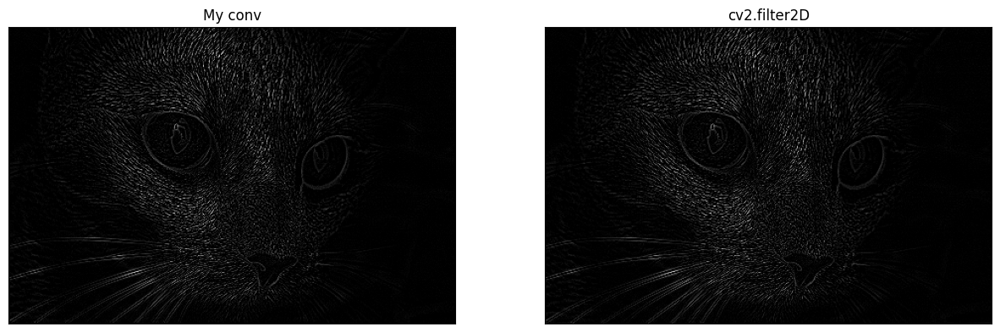

In [11]:
img = cv2.cvtColor(
    src=skimage.data.chelsea(),
    code=cv2.COLOR_RGB2GRAY,
)

kernel = np.array([[0, 1, 0],
                  [1, -4, 1],
                  [0, 1, 0]])
a = myconv2d(img, kernel, padding=1)
b = cv2.filter2D(src=img, ddepth=-1, kernel=kernel)

plt.figure(figsize=(15, 15))
plt.subplot(121)
plt.imshow(a, cmap='gray')
plt.xticks([])
plt.yticks([])
plt.title("My conv")

plt.subplot(122)
plt.imshow(b, cmap="gray")
plt.xticks([])
plt.yticks([])
plt.title("cv2.filter2D")
a.shape, b.shape, img.shape

In [12]:
d = np.zeros_like(a)
for i in range(a.shape[0]):
    for j in range(a.shape[1]):
        d[i, j] = a[i, j] - b[i, j]

<ipython-input-12-0a1f202390f7>:4: RuntimeWarning: overflow encountered in scalar subtract
  d[i, j] = a[i, j] - b[i, j]


array([[250, 254, 250, ..., 252, 254, 252],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [210,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0, 216, 240, ..., 247, 245, 248]], dtype=uint8)
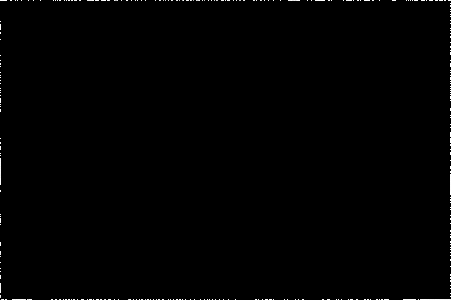

In [13]:
d

 Как можно заметить различия наблюдаются лишь по краям изображения.

In [14]:
print(f'Среднее : {np.round(np.mean(d), 2)} \nМедиана: {np.median(d)} \nМаксимум: \
{np.max(d)} \nМинимум: {np.min(d)}')

Среднее : 1.14 
Медиана: 0.0 
Максимум: 255 
Минимум: 0


В целом значения пикселей изображений, обработанных написанной вручную свёрткой и свёрткой из opencv, отличаются не сильно, в основном различие составляет ±6. В редких случаях больше, некоторые из них диаметрально противоположны (т.е. на одном изображении значение 0, а на другом 255) в основном в пределах погрешности ±6, т.е. либо 0+6, либо 255-6. Однако визуально отличия найти довольно трудно, т.к. оба фильтра довольно хорошо выполнили свою основную задачу с данным ядром -- выделение границ объектов.

Рассмотрим нелинейные фильтры. Многие из них нелокальны и адаптивны.

1. Медианный фильтр
```python
filtered_img = cv2.medianBlur(
      src=img,
      ksize=(5, 5), #kernel size
)
```
2. Гистограмное выравнивание
```python
filtered_img = cv2.equalizeHist(
      src=img,
)
```
3. Contrast Limited Adaptive Histogram Equalization (CLAHE). Описание [англ](https://en.wikipedia.org/wiki/Adaptive_histogram_equalization#Contrast_Limited_AHE)
```python
clahe = cv2.createCLAHE(
      clipLimit=40.0, # Threshold for contrast limiting
      tileGridSize=(8, 8),  # Grid size
)
filtered_img = clahe.apply(img)
```
4. Билатеральный фильтр. Описание [англ](https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html), [рус](https://habr.com/ru/post/273159/)
```python
filtered_img = cv2.bilateralFilter(
      src=img,
      d=9, #Diameter of each pixel neighborhood
      sigmaColor=75,  #Filter sigma in the color space
      sigmaSpace=75, #Filter sigma in the coordinate space
      borderType=cv2.BORDER_CONSTANT,
)
```

Разберем подробнее

# Гистограмное Выравнивание

Рассмотрим изображение, значения пикселей которого ограничены только определенным диапазоном значений. Например, на более ярком изображении все пиксели будут ограничены высокими значениями. Но хорошее изображение будет содержать пиксели из всех областей изображения. Поэтому вам нужно растянуть эту гистограмму до обоих концов, и это то, что делает выравнивание гистограммы (простыми словами). Обычно это улучшает контрастность изображения.

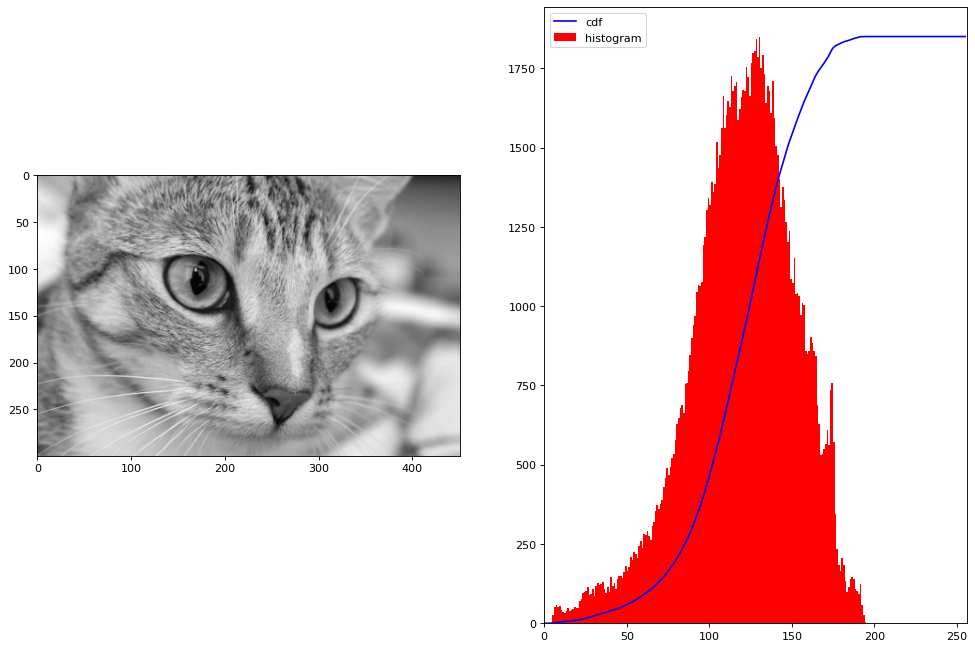

In [15]:
img = cv2.cvtColor(
    src=data.cat(),
    code=cv2.COLOR_RGB2GRAY,
)

def plot_hist(
    img: np.array,
) -> None:

    fig, axes = plt.subplots(
        ncols=2,
        figsize=(15, 10),
        dpi=80,
    )

    axes[0].imshow(
        img,
        cmap='gray',
    )

    hist, bins = np.histogram(
        a=img.flatten(),
        bins=256,
        range=[0,256],
    )
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    axes[1].plot(
        cdf_normalized,
        color='b',
    )
    axes[1].hist(
        x=img.flatten(),
        bins=256,
        range=[0,256],
        color='r',
    )
    axes[1].set_xlim([0,256])
    axes[1].legend(
        ('cdf','histogram'),
        loc='upper left',
    )

def plot_unhist(
    img: np.array,
) -> None:

    hist, bins = np.histogram(
        a=img.flatten(),
        bins=256,
        range=[0,256],
    )
    cdf = hist.cumsum()

    cdf_m = np.ma.masked_equal(
        x=cdf,
        value=0,
    )
    cdf_m = (cdf_m - cdf_m.min())/(cdf_m.max() - cdf_m.min()) * 255

    cdf = np.ma.filled(
        a=cdf_m,
        fill_value=0,
    )

    cdf = cdf.astype(np.uint8)

    img2 = cdf[img]

    plot_hist(img2)

plot_hist(img)

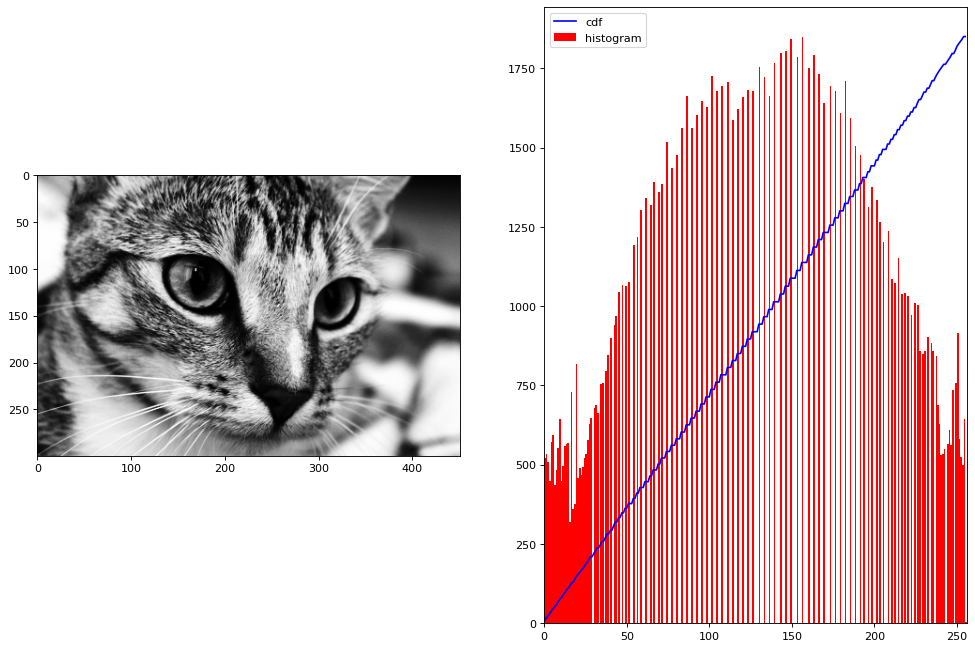

In [16]:
plot_unhist(img)

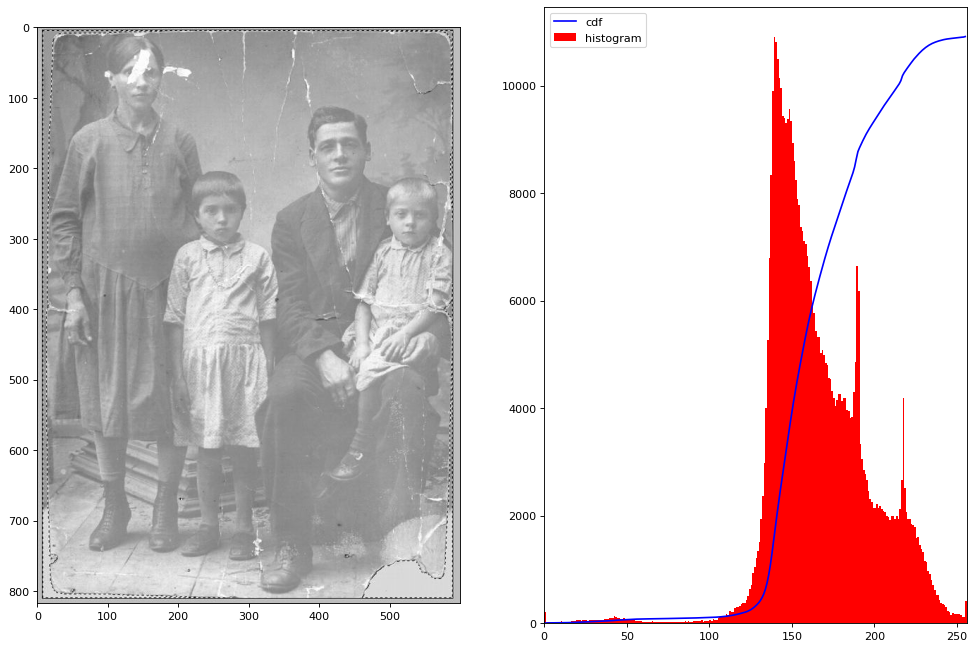

In [17]:
IMG_PATH = "data/image.jpg"
# IMG_PATH = "/content/image.jpg"

if not Path(IMG_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2023.git
    !mv cv_course_2023/seminars/seminar_03/data .

img = cv2.cvtColor(
    src=cv2.imread(IMG_PATH),
    code=cv2.COLOR_RGB2GRAY,
)

plot_hist(img)

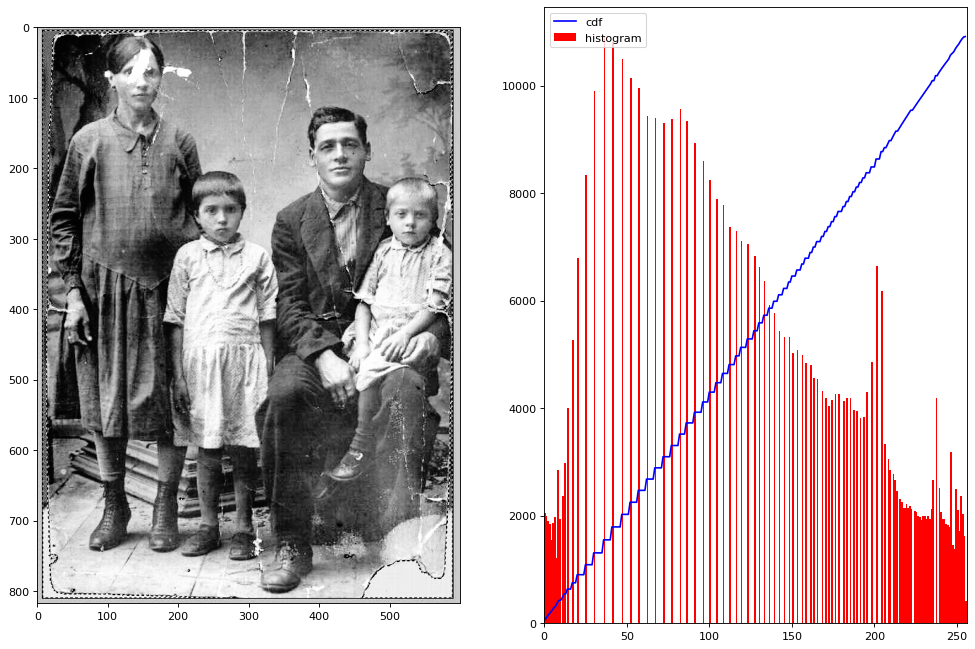

In [18]:
plot_unhist(img)

# Упражнение 4

Примените адаптивное гистограммное выравнивание CLAHE (используйте `cv2`), сравните результат с тем, что получалось при обычном гистограммном выравнивании.

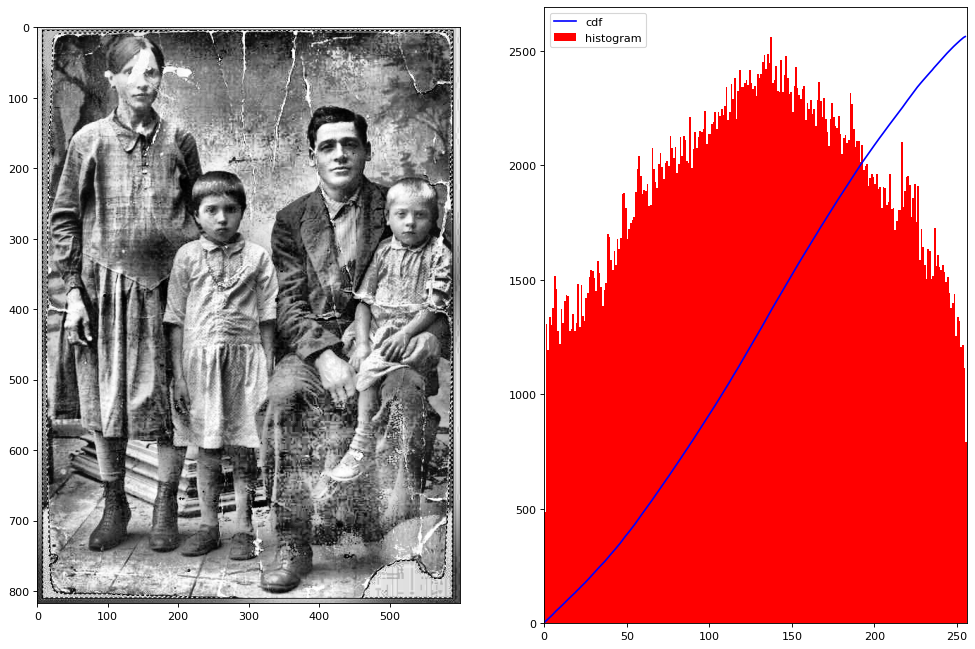

In [19]:
#your code here

clahe = cv2.createCLAHE() # default: clipLimit=40, tileGridSize=(8, 8)
cl1 = clahe.apply(img)
plot_hist(cl1)

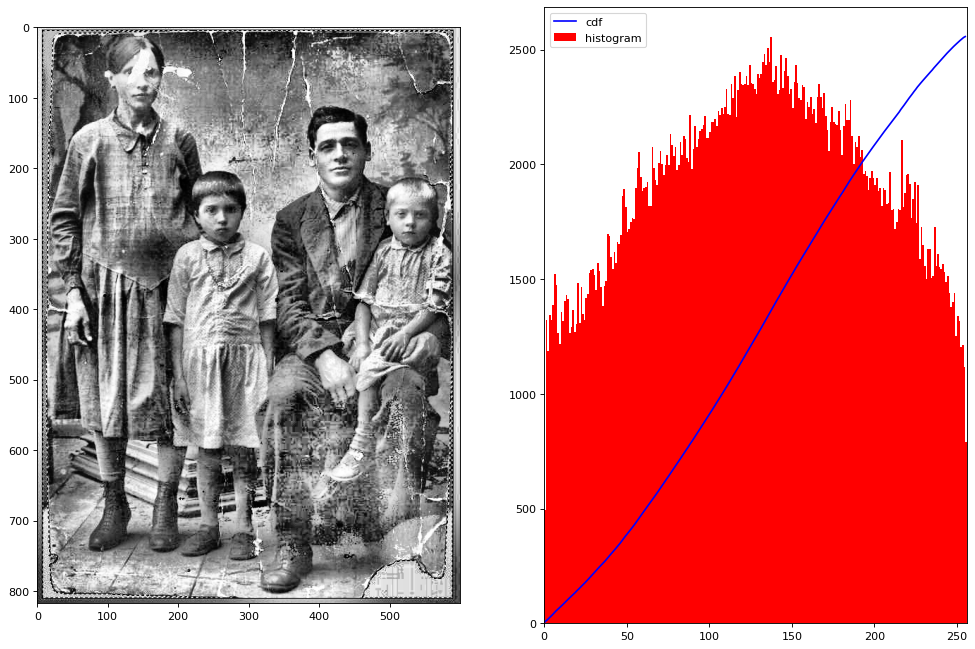

In [20]:
clahe = cv2.createCLAHE(clipLimit=100.0, tileGridSize=(8, 8))
cl1 = clahe.apply(img)
plot_hist(cl1)

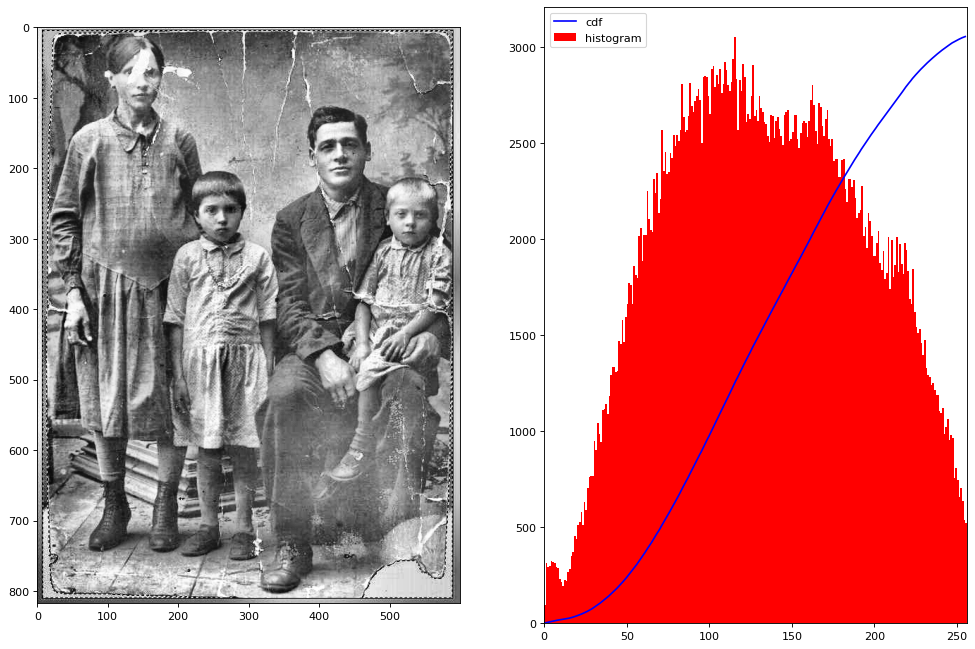

In [21]:
clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8))
cl1 = clahe.apply(img)
plot_hist(cl1)

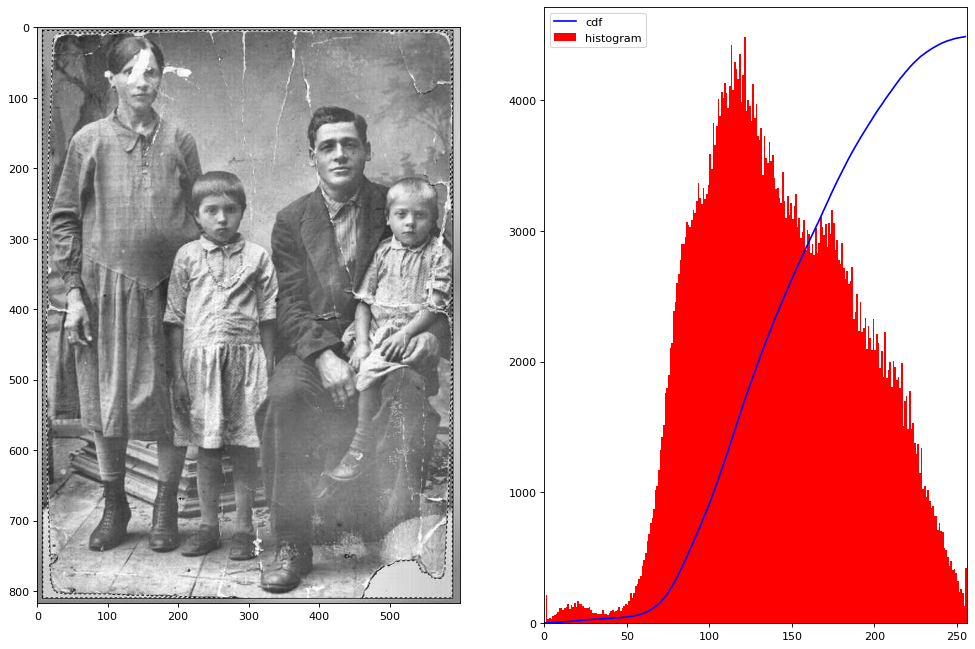

In [22]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
cl1 = clahe.apply(img)
plot_hist(cl1)

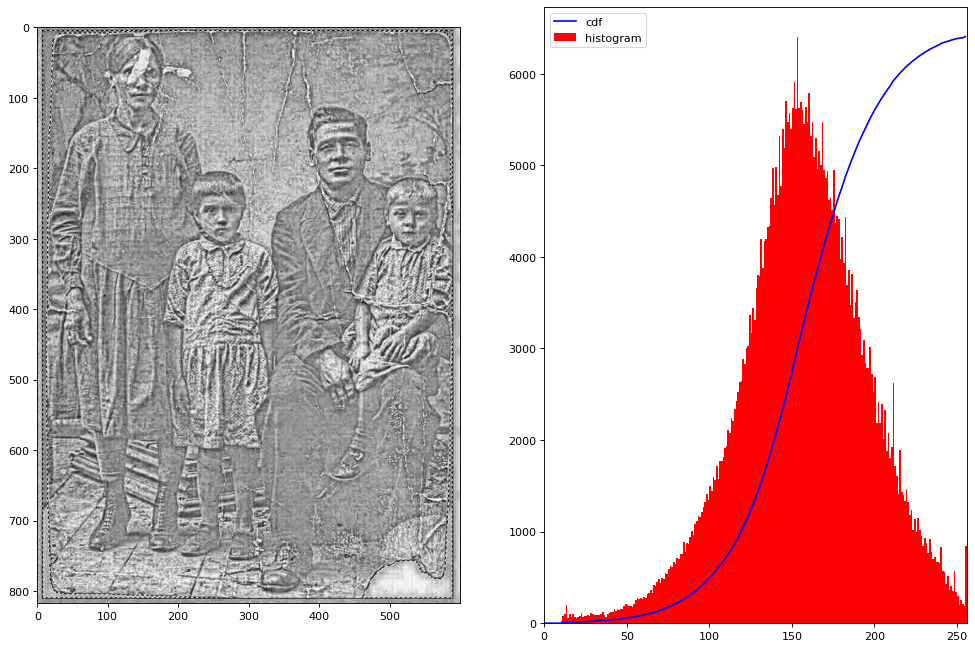

In [23]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(128, 128))
cl1 = clahe.apply(img)
plot_hist(cl1)

**Ответ:** Фильтр CLAHE (Contrast Limited Adaptive Histogram Equalization) интуитивно лучше, поскольку он более гибок. Разделяя изображение на тайлы, размеры которого можно задать, и позволяя регулировать лимит контрастности, можно достигнуть более хорошего качества выходного изображения, чем при гистограммном выравнивании.

Гистограммное выравнивание увеличивает глобальную контрастность изображений, особенно когда пиксели последних представлены в узком диапазоне значений интенсивности. Благодаря этой настройке достигается более равномерное использование всего диапазона интенсивностей за счёт эффективного перераспредления наиболее часто встречающихся значений интенсивностей, ухудшающих контрастность. Таким образом области с низким локальным контрастом становятся более контрастными. Однако данная методика может увеличить и контрастность фонового шума при одновременном уменьшении полезного сигнала, что является существенным недостатком.

Фильтр CLAHE позволяет избежать этих недостатков, осуществляя выравнивание по тайлам. Если в этих тайлах присутствует шум, то его влияния можно избежать путём ограничения контрастности. Ограничение контрастности работает так, что пиксели, превышающие указанный лимит будут обрезаны и равномерно распределены по другим интервалам. По графикам видно, что увеличение размера тайла будет приводить к формированию нормального распределения, в котором может присутствовать асимметрия и эксцесс. Если же, повышать лимит контрастности, то хвосты распределения будут подтягиваться, а само распределение будет стремиться к равномерному.

В нашем случае, оба фильтра справились хорошо. Гибкость фильтра CLAHE позволяет достигать различных интересных эффектов для входного изображения.